# SunRGB Data Analysis on the x, y, z, coordinates distributions of objects

## Processing the Numpy files:

In [2]:
## Open a .npy file
import numpy as np
import matplotlib.pyplot as plt
import sys

filename = "3d_visualizations/000001_bbox.npy"
data = np.load(filename)
print(data.shape)
print(data)

(3, 8)
[[ 1.047307    4.168696   -0.246859    1.151035    0.943792    0.984807
   1.69564944  1.        ]
 [ 2.431818    4.840909   -0.75        0.273673    0.287264    0.45
   1.65393706  6.        ]
 [-1.086364    1.904545   -0.147727    0.356405    0.781567    1.052273
   0.1022069   5.        ]]


In [16]:
import open3d as o3d

# Create a point cloud from the bounding box corners
pcd = o3d.geometry.PointCloud()
pcd.points = o3d.utility.Vector3dVector(data.T)  # Transpose data to fit Open3D's expected input shape

# Compute the oriented bounding box
obb = pcd.get_oriented_bounding_box()
o3d.visualization.draw_plotly([obb])

Understanding the Array Structure:
* Each sub-array (row) is a bounding box.
* First three columns tell us the center coordinates of the bounding box
* Next three columns tell us the size of the bounding box
* Second last column tells us the angle of the bounding box
* Last column is the class of the bounding box

In [9]:
## Open a .npz file
filename = "3d_visualizations/000001_pc.npz"
data = np.load(filename)
print(data.files)
print(data['pc'].shape)

pc = data['pc']
print(pc)

# Extracting x, y, z coordinates
x = pc[:, 0]
y = pc[:, 1]
z = pc[:, 2]

['pc']
(50000, 6)
[[-0.13692206  3.207896   -1.193742    0.58431375  0.58431375  0.5764706 ]
 [-0.711127    1.9399852  -1.1960868   0.654902    0.64705884  0.6509804 ]
 [-0.25871503  5.5842195   0.70755565  0.7411765   0.80784315  0.7372549 ]
 ...
 [-0.9264188   1.3429244   0.16825275  0.32941177  0.21176471  0.21960784]
 [-0.9062335   2.9011097  -0.49964306  0.18039216  0.1254902   0.1254902 ]
 [-0.56909055  1.9241513  -1.2035404   0.65882355  0.6509804   0.654902  ]]


Dimensions of the Array:
* 50000 represents the number of points in the point cloud.
* 6 likely represents the dimensions or features of each point.


Interpreting the Features:

The six features in each point could represent various data depending on the context. Typically, these could include:
* x, y, z: Cartesian coordinates of each point in 3D space.
* r, g, b: Color values for each point, often stored as red, green, and blue components. Alternatively, these could also be normal vectors or additional spatial information like intensity or return magnitude if dealing with LiDAR data.

In [15]:
import open3d as o3d

points = pc[:, :3]
colors = pc[:, 3:]

# Create and fill a PointCloud object
pcd = o3d.geometry.PointCloud()
pcd.points = o3d.utility.Vector3dVector(points)
pcd.colors = o3d.utility.Vector3dVector(colors)

# Visualize the point cloud
o3d.visualization.draw_plotly([pcd])

In [18]:
o3d.visualization.draw_plotly([obb, pcd])

: 

In [12]:
# Import module
import os
 
# Assign directory
directory = r"3d_visualizations"
 
# Iterate over files in directory
for name in sorted(os.listdir(directory)):
    # Read content of .npy files:
    if name.endswith(".npy"):
        data = np.load(os.path.join(directory, name))
        print(f"{name}: shape: ", data.shape)
        print(data[: , -1])

    if name.endswith(".npz"):
        data = np.load(os.path.join(directory, name))
        print(f"{name}: shape: ", data['pc'].shape)

000001_bbox.npy: shape:  (3, 8)
[1. 6. 5.]
000001_pc.npz: shape:  (50000, 6)
000002_bbox.npy: shape:  (2, 8)
[1. 6.]
000002_pc.npz: shape:  (50000, 6)
000003_bbox.npy: shape:  (3, 8)
[1. 6. 5.]
000003_pc.npz: shape:  (50000, 6)
000004_bbox.npy: shape:  (2, 8)
[1. 6.]
000004_pc.npz: shape:  (50000, 6)
000005_bbox.npy: shape:  (1, 8)
[1.]
000005_pc.npz: shape:  (50000, 6)
000006_bbox.npy: shape:  (3, 8)
[1. 6. 5.]
000006_pc.npz: shape:  (50000, 6)
000007_bbox.npy: shape:  (1, 8)
[1.]
000007_pc.npz: shape:  (50000, 6)
000008_bbox.npy: shape:  (1, 8)
[1.]
000008_pc.npz: shape:  (50000, 6)
000009_bbox.npy: shape:  (2, 8)
[1. 6.]
000009_pc.npz: shape:  (50000, 6)
000010_bbox.npy: shape:  (3, 8)
[1. 6. 6.]
000010_pc.npz: shape:  (50000, 6)
000011_bbox.npy: shape:  (4, 8)
[1. 6. 5. 6.]
000011_pc.npz: shape:  (50000, 6)
000012_bbox.npy: shape:  (2, 8)
[1. 6.]
000012_pc.npz: shape:  (50000, 6)
000013_bbox.npy: shape:  (3, 8)
[1. 6. 5.]
000013_pc.npz: shape:  (50000, 6)
000014_bbox.npy: shape:  (

## Analysing distributions of coordinates of bounding boxes

In [17]:
# Import module
import os
 
# Assign directory
directory = r"3d_visualizations"

def load_data(directory):
    class_dict = {}
 
    # Iterate over files in directory
    for name in sorted(os.listdir(directory)):
        # Read content of .npy files:
        if name.endswith(".npy"):
            data = np.load(os.path.join(directory, name))
            print(f"{name}: shape: ", data.shape)
            
            # Iterate through rows of the numpy array
            for row in data:
                # Get the class label
                class_label = row[-1]
                # print(class_label)
                if class_label in class_dict:
                    class_dict[class_label].append(np.take(row, [0,1,2,7]))
                else:
                    class_dict[class_label] = [np.take(row, [0,1,2,7])]
            
    return class_dict

class_dict = load_data(directory)

print(class_dict.keys())
print(class_dict)

000001_bbox.npy: shape:  (3, 8)
000002_bbox.npy: shape:  (2, 8)
000003_bbox.npy: shape:  (3, 8)
000004_bbox.npy: shape:  (2, 8)
000005_bbox.npy: shape:  (1, 8)
000006_bbox.npy: shape:  (3, 8)
000007_bbox.npy: shape:  (1, 8)
000008_bbox.npy: shape:  (1, 8)
000009_bbox.npy: shape:  (2, 8)
000010_bbox.npy: shape:  (3, 8)
000011_bbox.npy: shape:  (4, 8)
000012_bbox.npy: shape:  (2, 8)
000013_bbox.npy: shape:  (3, 8)
000014_bbox.npy: shape:  (3, 8)
000015_bbox.npy: shape:  (4, 8)
000016_bbox.npy: shape:  (3, 8)
000017_bbox.npy: shape:  (2, 8)
000018_bbox.npy: shape:  (3, 8)
000019_bbox.npy: shape:  (3, 8)
000020_bbox.npy: shape:  (3, 8)
dict_keys([1.0, 6.0, 5.0, 7.0])
{1.0: [array([ 1.047307,  4.168696, -0.246859,  1.      ]), array([-0.536667,  2.556667, -0.515386,  1.      ]), array([-0.186925,  3.165501, -0.479232,  1.      ]), array([-0.248717,  3.078656, -0.411026,  1.      ]), array([ 0.11428 ,  2.528923, -0.405945,  1.      ]), array([ 0.265355,  2.57315 , -0.397693,  1.      ]), arr

## Plotting coordinates distributions

(20, 4)
Class 1.0:
Mean x: 0.1296087
Mean y: 2.94548655
Mean z: -0.5048750500000001
Std x: 0.5431173049917577
Std y: 0.4989032951995281
Std z: 0.10119880080340626
(19, 4)
Class 6.0:
Mean x: 0.31469847368421044
Mean y: 3.624992421052631
Mean z: -0.8707902105263159
Std x: 1.385643308252747
Std y: 0.6719098232556223
Std z: 0.07566975632838911
(10, 4)
Class 5.0:
Mean x: -0.2012659000000001
Mean y: 3.2134209
Mean z: -0.570417
Std x: 1.469184513415279
Std y: 0.847451421996382
Std z: 0.18439271434468335
(2, 4)
Class 7.0:
Mean x: 0.6737704999999999
Mean y: 4.2234605
Mean z: -0.763603
Std x: 1.7037705
Std y: 0.25653950000000014
Std z: 0.010523999999999978


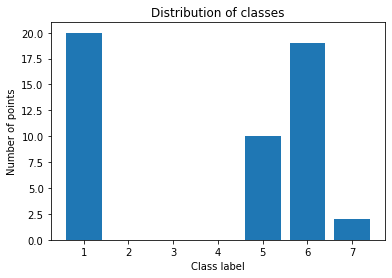

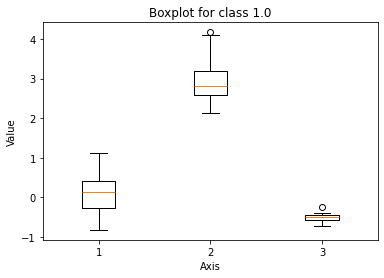

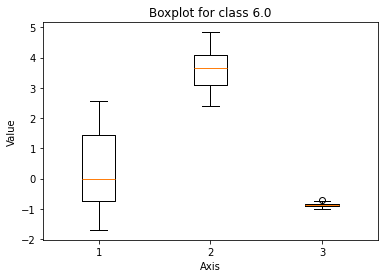

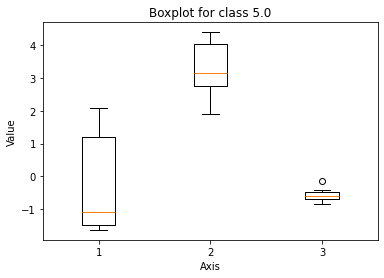

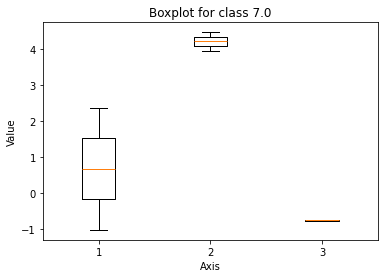

In [27]:
# Plot the distribution of the classes
plt.bar(class_dict.keys(), [len(class_dict[key]) for key in class_dict.keys()])
plt.xlabel('Class label')
plt.ylabel('Number of points')
plt.title('Distribution of classes')


# Find the boxplot for each classses' data
def analyze_classdict(class_dict):
    for key in class_dict.keys():
        data = class_dict[key]
        array = np.array(data)
        print(array.shape)

        x = array[:, 0]
        y = array[:, 1]
        z = array[:, 2]

        # Calculate the mean and standard deviation for each axis
        print(f"Class {key}:")
        print(f"Mean x: {np.mean(x)}")
        print(f"Mean y: {np.mean(y)}")
        print(f"Mean z: {np.mean(z)}")
        print(f"Std x: {np.std(x)}")
        print(f"Std y: {np.std(y)}")
        print(f"Std z: {np.std(z)}")

        # Plot individual boxplots for each class and each axis (x, y, z)
        plt.figure()
        plt.boxplot([x, y, z])
        plt.title(f'Boxplot for class {key}')
        plt.xlabel('Axis')
        plt.ylabel('Value')

    plt.show()

analyze_classdict(class_dict)

## Identifying outliers and plot them as 3D Point clouds